# Fundamentos de Geoinformática

# CentroGeo

## David Martínez

In [1]:
import pandas as pd
import geopandas as gpd
import geoplot
import mapclassify
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

# Carga de datos

Cargo los datos del índice de gini para cada estado a nivel nacional.

In [2]:
df_gini = pd.read_csv('../data/tabla2_3_basicos_inegi.csv', header=0)
df_gini.head()

,decil,ingreso,entidad_federativa
0,I,2174,NACIONAL
1,II,3778,NACIONAL
2,III,4937,NACIONAL
3,IV,6110,NACIONAL
4,V,7351,NACIONAL


Reviso las columnas del dataframe

# Visualizaciones

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32],
 <a list of 33 Text xticklabel objects>)

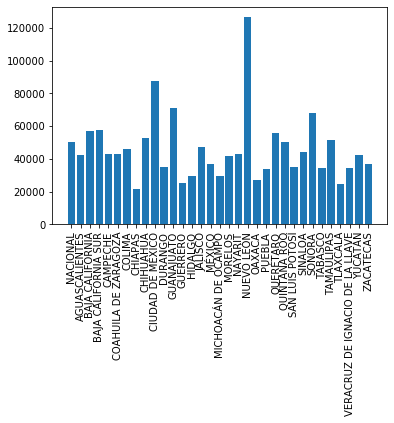

In [3]:
plt.bar(df_gini.entidad_federativa, df_gini.ingreso)
plt.xticks(rotation=90)

<BarContainer object of 330 artists>

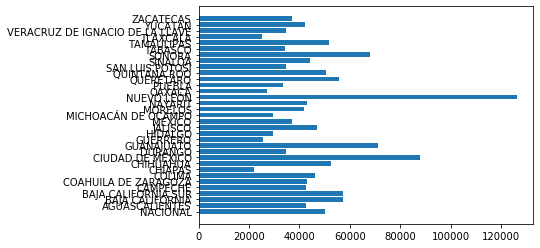

In [4]:
plt.barh(df_gini.entidad_federativa, df_gini.ingreso)

# Visualización del coeficiente de gini por entidad federativa

Cargo los límites estatales para hacer una unión de cada estado con su coeficiente y poder visualizarlo en un mapa

In [5]:
estados = gpd.read_file('../data/limite_estatal.geojson')
estados.head()

,IDESTADO,ESTADO,ID,geometry
0,01,AGUASCALIENTES,2,"MULTIPOLYGON (((-102.28742 22.41615, -102.2869..."
1,02,BAJA CALIFORNIA,1,"MULTIPOLYGON (((-113.51457 29.55073, -113.5133..."
2,03,BAJA CALIFORNIA SUR,1,"MULTIPOLYGON (((-111.30891 26.08713, -111.3096..."
3,04,CAMPECHE,3,"MULTIPOLYGON (((-90.48305 20.21028, -90.48286 ..."
4,07,CHIAPAS,3,"MULTIPOLYGON (((-91.97364 17.91143, -91.96993 ..."


In [6]:
df_gini[df_gini.entidad_federativa != 'NACIONAL']

,decil,ingreso,entidad_federativa
10,I,2943,AGUASCALIENTES
11,II,4770,AGUASCALIENTES
12,III,5996,AGUASCALIENTES
13,IV,7148,AGUASCALIENTES
14,V,8381,AGUASCALIENTES
...,...,...,...
325,VI,6899,ZACATECAS
326,VII,8299,ZACATECAS
327,VIII,10516,ZACATECAS
328,IX,14643,ZACATECAS


In [7]:
# Elimino el registro nacional de la tabla del índice de gini para poder hacer el join y calculo el promedio del ingreso para poder graficarlo

In [8]:
df_gini = df_gini[df_gini.entidad_federativa != 'NACIONAL']
df_gini = df_gini.rename(columns={'entidad_federativa': 'ESTADO'})

In [9]:
df_gini = df_gini.groupby('ESTADO').mean()
df_gini

,ingreso
ESTADO,
AGUASCALIENTES,12833.0
BAJA CALIFORNIA,17053.9
BAJA CALIFORNIA SUR,16783.0
CAMPECHE,12055.4
CHIAPAS,5713.1
CHIHUAHUA,13899.2
CIUDAD DE MÉXICO,21941.1
COAHUILA DE ZARAGOZA,12797.1
COLIMA,13915.8


In [16]:
data = estados.merge(df_gini, on=['ESTADO'], how='left')
data.head()

,IDESTADO,ESTADO,ID,geometry,ingreso
0,01,AGUASCALIENTES,2,"MULTIPOLYGON (((-102.28742 22.41615, -102.2869...",12833.0
1,02,BAJA CALIFORNIA,1,"MULTIPOLYGON (((-113.51457 29.55073, -113.5133...",17053.9
2,03,BAJA CALIFORNIA SUR,1,"MULTIPOLYGON (((-111.30891 26.08713, -111.3096...",16783.0
3,04,CAMPECHE,3,"MULTIPOLYGON (((-90.48305 20.21028, -90.48286 ...",12055.4
4,07,CHIAPAS,3,"MULTIPOLYGON (((-91.97364 17.91143, -91.96993 ...",5713.1


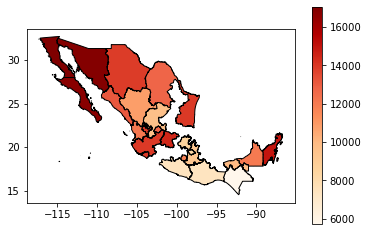

In [18]:
data.plot(column='ingreso', cmap='OrRd', edgecolor='k', legend=True)